In [1]:
import yfinance as yf
import pandas as pd
from zipline.api import order_target_percent, symbol, set_commission, set_benchmark, order,record, order_target, get_open_orders
from zipline.utils.calendar_utils import get_calendar
from zipline import run_algorithm
import matplotlib.pyplot as plt
import numpy as np

## Download Tesla stock from yfinance

In [32]:
start_date = '2010-01-01'
end_date = '2023-01-01'

tesla_data = yf.download("TSLA", start=start_date, end=end_date)

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2022-12-23,126.370003,128.619995,121.019997,123.150002,123.150002,166989700
2022-12-27,117.500000,119.669998,108.760002,109.099998,109.099998,208643400
2022-12-28,110.349998,116.269997,108.239998,112.709999,112.709999,221070500
2022-12-29,120.389999,123.570000,117.500000,121.820000,121.820000,221923300
2022-12-30,119.949997,124.480003,119.750000,123.180000,123.180000,157777300


In [33]:
tesla_data.to_csv('./custom_data/tesla_data.csv')

In [34]:
tesla_data = pd.read_csv('./custom_data/tesla_data.csv')


## Data Preprocessing for ingesting it to zipline

In [35]:
tesla_data = tesla_data.drop('Adj Close', axis= 1)
tesla_data.head()

,Date,Open,High,Low,Close,Volume
0,2010-06-29,1.266667,1.666667,1.169333,1.592667,281494500
1,2010-06-30,1.719333,2.028000,1.553333,1.588667,257806500
2,2010-07-01,1.666667,1.728000,1.351333,1.464000,123282000
3,2010-07-02,1.533333,1.540000,1.247333,1.280000,77097000
4,2010-07-06,1.333333,1.333333,1.055333,1.074000,103003500


In [36]:
new_column_names = {'Date': 'date', 'Open':'open', 'High': 'high', 'Low':'low', 'Close': 'close', 'Volume': 'volume'}

tesla_data.rename(columns=new_column_names, inplace=True)
tesla_data.head()

,date,open,high,low,close,volume
0,2010-06-29,1.266667,1.666667,1.169333,1.592667,281494500
1,2010-06-30,1.719333,2.028000,1.553333,1.588667,257806500
2,2010-07-01,1.666667,1.728000,1.351333,1.464000,123282000
3,2010-07-02,1.533333,1.540000,1.247333,1.280000,77097000
4,2010-07-06,1.333333,1.333333,1.055333,1.074000,103003500


In [37]:
column_data_types = tesla_data.dtypes
column_data_types

date       object
open      float64
high      float64
low       float64
close     float64
volume      int64
dtype: object

In [38]:
tesla_data.iloc[:, 1:] = tesla_data.iloc[:, 1:].apply(lambda x: x.astype(float))
column_data_types = tesla_data.dtypes
column_data_types

date       object
open      float64
high      float64
low       float64
close     float64
volume    float64
dtype: object

In [39]:
tesla_data['timestamp'] = pd.to_datetime(tesla_data['date'])
tesla_data = tesla_data.reindex(columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
tesla_data['timestamp'] = tesla_data['timestamp'].dt.strftime('%Y-%m-%d %H:%M:%S.%f')
tesla_data.head()

,timestamp,open,high,low,close,volume
0,2010-06-29 00:00:00.000000,1.266667,1.666667,1.169333,1.592667,281494500.0
1,2010-06-30 00:00:00.000000,1.719333,2.028000,1.553333,1.588667,257806500.0
2,2010-07-01 00:00:00.000000,1.666667,1.728000,1.351333,1.464000,123282000.0
3,2010-07-02 00:00:00.000000,1.533333,1.540000,1.247333,1.280000,77097000.0
4,2010-07-06 00:00:00.000000,1.333333,1.333333,1.055333,1.074000,103003500.0


In [45]:
tesla_data = tesla_data.sort_values(by='timestamp', ascending=True)
tesla_data = tesla_data.reset_index(drop=True)
tesla_data

,timestamp,open,high,low,close,volume
0,2010-06-29 00:00:00.000000,1.266667,1.666667,1.169333,1.592667,281494500.0
1,2010-06-30 00:00:00.000000,1.719333,2.028000,1.553333,1.588667,257806500.0
2,2010-07-01 00:00:00.000000,1.666667,1.728000,1.351333,1.464000,123282000.0
3,2010-07-02 00:00:00.000000,1.533333,1.540000,1.247333,1.280000,77097000.0
4,2010-07-06 00:00:00.000000,1.333333,1.333333,1.055333,1.074000,103003500.0
...,...,...,...,...,...,...
3145,2022-12-23 00:00:00.000000,126.370003,128.619995,121.019997,123.150002,166989700.0
3146,2022-12-27 00:00:00.000000,117.500000,119.669998,108.760002,109.099998,208643400.0
3147,2022-12-28 00:00:00.000000,110.349998,116.269997,108.239998,112.709999,221070500.0
3148,2022-12-29 00:00:00.000000,120.389999,123.570000,117.500000,121.820000,221923300.0


In [47]:
tesla_data = tesla_data.groupby('timestamp').last().reset_index()
tesla_data

,timestamp,open,high,low,close,volume
0,2010-06-29 00:00:00.000000,1.266667,1.666667,1.169333,1.592667,281494500.0
1,2010-06-30 00:00:00.000000,1.719333,2.028000,1.553333,1.588667,257806500.0
2,2010-07-01 00:00:00.000000,1.666667,1.728000,1.351333,1.464000,123282000.0
3,2010-07-02 00:00:00.000000,1.533333,1.540000,1.247333,1.280000,77097000.0
4,2010-07-06 00:00:00.000000,1.333333,1.333333,1.055333,1.074000,103003500.0
...,...,...,...,...,...,...
3145,2022-12-23 00:00:00.000000,126.370003,128.619995,121.019997,123.150002,166989700.0
3146,2022-12-27 00:00:00.000000,117.500000,119.669998,108.760002,109.099998,208643400.0
3147,2022-12-28 00:00:00.000000,110.349998,116.269997,108.239998,112.709999,221070500.0
3148,2022-12-29 00:00:00.000000,120.389999,123.570000,117.500000,121.820000,221923300.0


In [51]:
tesla_data.set_index('timestamp', inplace=True)
tesla_data.to_csv('./daily/tesla_data.csv')

## Importing custom data to Zipline

In [1]:
!zipline bundles

csvdir <no ingestions>
quandl <no ingestions>
quantopian-quandl <no ingestions>
tesla_data_z 2023-12-07 06:48:21.668341


In [2]:
!zipline ingest -b tesla_data_z

[2023-12-07T12:49:00+0600-INFO][zipline.data.bundles.core]
 Ingesting tesla_data_z
Loading custom pricing data:   [####################################]  100%
Merging daily equity files:  [####################################]   


In [2]:
symb = 'tesla_data'
calendar = get_calendar('XNYS')
capital_base = 10000
short_window = 100
long_window = 300

def initialize(context):
    context.i = 0
    context.asset = symbol(symb)
    set_benchmark(symbol(symb))



def handle_data(context, data):
    # Skip first 300 days to get full windows
    context.i += 1
    if context.i < max(short_window, long_window):
        return

    # Compute averages
    # data.history() has to be called with the same params
    # from above and returns a pandas dataframe.
    short_mavg = data.history(context.asset, 'price', bar_count=30, frequency="1d").ewm(span=short_window, adjust=True).mean()[-1]
    long_mavg = data.history(context.asset, 'price', bar_count=110, frequency="1d").ewm(span=long_window, adjust=True).mean()[-1]

    open_orders = get_open_orders()

    if context.asset not in open_orders:
        # Trading logic
        if short_mavg > long_mavg:
            # order_target orders as many shares as needed to
            # achieve the desired number of shares.
            order_target(context.asset, 100)
        elif short_mavg < long_mavg:
            order_target(context.asset, 0)

In [3]:
def rolling_sharpe(ret):
    return np.multiply(np.divide(ret.mean(), ret.std()), np.sqrt(252))

def get_rolling_stats(result, r_window):
    result["rolling_sharpe"] = result["portfolio_value"].pct_change().rolling(r_window).apply(rolling_sharpe)
    result["rolling_vol"] = result["portfolio_value"].pct_change().rolling(r_window).std()
    stats = [result.rolling_sharpe.mean(), result.portfolio_value.mean(), result.rolling_vol.mean()]
    return result, stats

def show_rolling_stats(result, r_window):
    result, stats = get_rolling_stats(result, r_window)
    fig, ax = plt.subplots(1, 3, figsize=(18,4))
    result['rolling_sharpe'].plot(ax = ax[0], title='Rolling sharpe')
    result['rolling_vol'].plot(ax = ax[1], title='Rolling vol')
    result['portfolio_value'].plot(ax = ax[2], title='Portfolio value')
    plt.show()
    return result

In [4]:
start_date = pd.to_datetime('2010-06-29 00:00:00.000000', format='%Y-%m-%d %H:%M:%S.%f')
end_date = pd.to_datetime('2023-01-01 00:00:00.000000', format='%Y-%m-%d %H:%M:%S.%f')

result_2010_onward = run_algorithm(
    start= start_date,
    end = end_date,
    initialize=initialize,
    handle_data=handle_data,
    capital_base=capital_base,
    trading_calendar=calendar,
    bundle='tesla_data_z',
    data_frequency='daily'
)

/home/popeye/.local/lib/python3.10/site-packages/zipline/data/data_portal.py:951: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method="ffill", inplace=True)
/home/popeye/.local/lib/python3.10/site-packages/zipline/sources/benchmark_source.py:295: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  returns[0] = first_day_return
/home/popeye/.local/lib/python3.10/site-packages/zipline/finance/ledger.py:424: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  self.daily_returns_series[session_ix] = self.todays_returns
/h

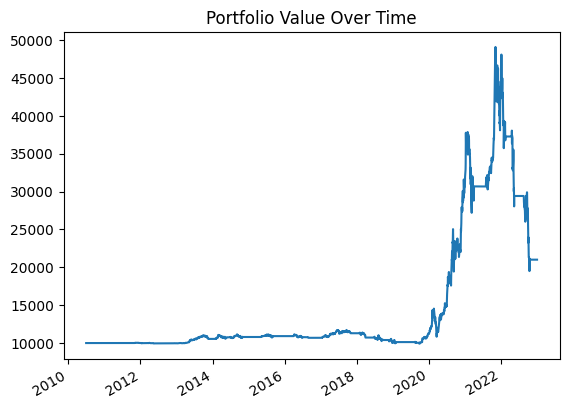

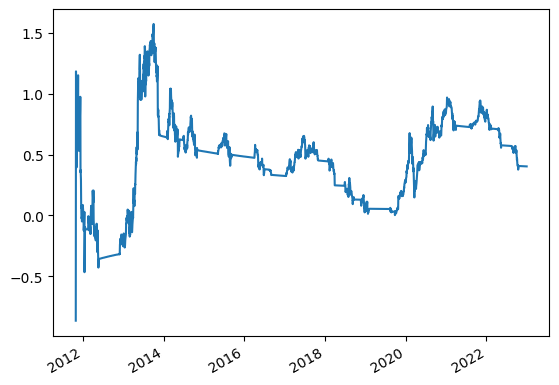

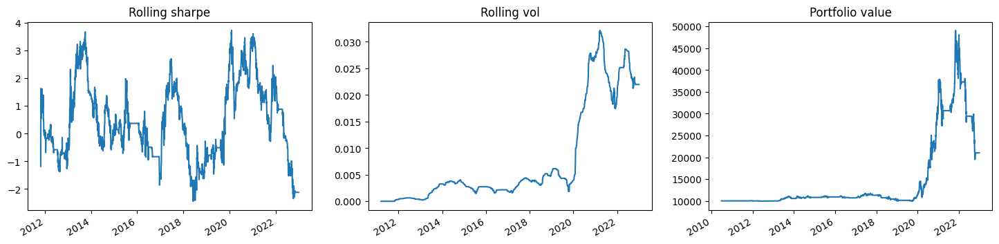

In [5]:
result_2010_onward.portfolio_value.plot(label='Portfolio Value')
plt.title('Portfolio Value Over Time')
plt.show()
result_2010_onward.sharpe.plot()
result_2010_plot = show_rolling_stats(result_2010_onward, 180)

## Trying different Short and Long Window

In [6]:
short_window = 100
long_window = 300

def initialize(context):
    context.i = 0
    context.asset = symbol(symb)
    set_benchmark(symbol(symb))



def handle_data(context, data):
    # Skip first 300 days to get full windows
    context.i += 1
    if context.i < max(short_window, long_window):
        return

    # Compute averages
    # data.history() has to be called with the same params
    # from above and returns a pandas dataframe.
    short_mavg = data.history(context.asset, 'price', bar_count=short_window, frequency="1d").ewm(span=short_window, adjust=True).mean()[-1]
    long_mavg = data.history(context.asset, 'price', bar_count=long_window, frequency="1d").ewm(span=long_window, adjust=True).mean()[-1]

    open_orders = get_open_orders()

    if context.asset not in open_orders:
        # Trading logic
        if short_mavg > long_mavg:
            # order_target orders as many shares as needed to
            # achieve the desired number of shares.
            order_target(context.asset, 100)
        elif short_mavg < long_mavg:
            order_target(context.asset, 0)


result_2020_onward = run_algorithm(
    start= start_date,
    end = end_date,
    initialize=initialize,
    handle_data=handle_data,
    capital_base=capital_base,
    trading_calendar=calendar,
    bundle='tesla_data_z',
    data_frequency='daily'
)

/home/popeye/.local/lib/python3.10/site-packages/zipline/data/data_portal.py:951: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method="ffill", inplace=True)
/home/popeye/.local/lib/python3.10/site-packages/zipline/sources/benchmark_source.py:295: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  returns[0] = first_day_return
/home/popeye/.local/lib/python3.10/site-packages/zipline/finance/ledger.py:424: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  self.daily_returns_series[session_ix] = self.todays_returns
/h

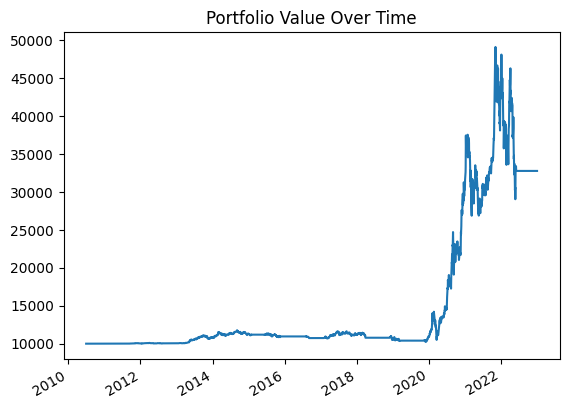

<Axes: >

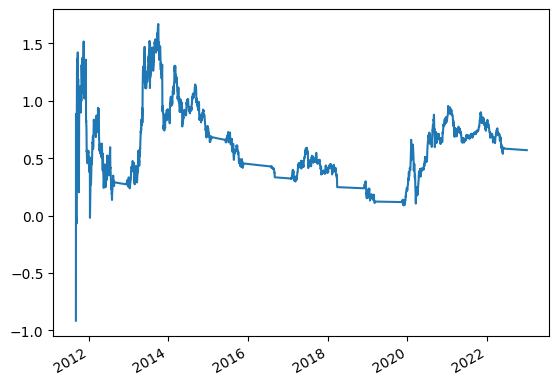

In [7]:
result_2020_onward .portfolio_value.plot(label='Portfolio Value')
plt.title('Portfolio Value Over Time')
plt.show()
result_2020_onward.sharpe.plot()

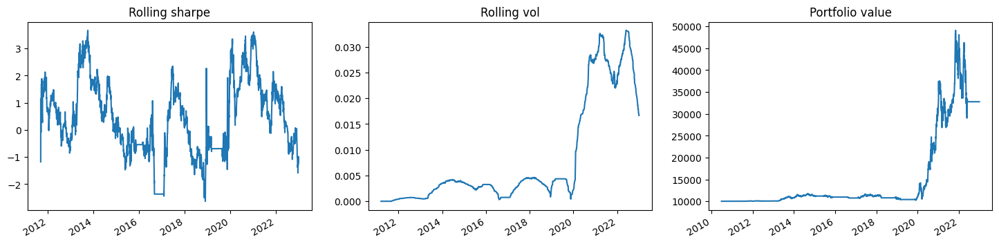

In [8]:
result_1 = show_rolling_stats(result_2020_onward, 180)

In [15]:
def initialize(context):
    context.asset = symbol(symb)
    context.prices = []

def handle_data(context, data):
    # Update price history
    context.prices.append(data.current(context.asset, "price"))
    if len(context.prices) < 10:
        return

    # Calculate indicators
    prices = pd.DataFrame(context.prices)
    macd = prices.ewm(span=12, adjust=False).mean() - prices.ewm(span=26, adjust=False).mean()
    signal = macd.ewm(span=9, adjust=False).mean()
    mavg = prices.rolling(window=20).mean()
    std = prices.rolling(window=20).std()
    upper_band = mavg + std * 2
    lower_band = mavg - std * 2

    price = data.current(context.asset, "price")


    # Define trading signals
    buy_signal = macd.iloc[-1] > signal.iloc[-1] and price < upper_band.iloc[-1]
    sell_signal = macd.iloc[-1] < signal.iloc[-1] and price > lower_band.iloc[-1]

    # Execute trades based on signals
    if buy_signal:
        order_target(context.asset, 100)
    elif sell_signal:
        order_target(context.asset, 0)

In [16]:
start_date = pd.to_datetime('2020-01-01 00:00:00.000000', format='%Y-%m-%d %H:%M:%S.%f')
end_date = pd.to_datetime('2023-01-01 00:00:00.000000', format='%Y-%m-%d %H:%M:%S.%f')
capital_base = 10000
calendar = get_calendar('XNYS')
symb = 'tesla_data'

result_2020_onward = run_algorithm(
    start= start_date,
    end = end_date,
    initialize=initialize,
    handle_data=handle_data,
    capital_base=capital_base,
    trading_calendar=calendar,
    bundle='tesla_data_z',
    data_frequency='daily'
)

/home/popeye/.local/lib/python3.10/site-packages/zipline/finance/ledger.py:424: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  self.daily_returns_series[session_ix] = self.todays_returns
/home/popeye/.local/lib/python3.10/site-packages/empyrical/stats.py:710: RuntimeWarning: invalid value encountered in divide
  np.divide(
/home/popeye/.local/lib/python3.10/site-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)


ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [9]:
from zipline.api import data

ImportError: cannot import name 'data' from 'zipline.api' (/home/popeye/.local/lib/python3.10/site-packages/zipline/api.py)